In [3]:
import pickle
import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.model_selection import train_test_split
import shap
import matplotlib.pyplot as pl

In [4]:
with open('result.pickle','rb') as load_data:
    result = pickle.load(load_data)
with open('record_slice.pickle','rb') as load_data:
    data = pickle.load(load_data)
data_df=pd.DataFrame(data)

In [5]:
shap.initjs()

#建立x与y

Xt, Xv, yt, yv = train_test_split(data_df,result, test_size=0.2, random_state=10)
dt = xgb.DMatrix(Xt, label=yt.values)
dv = xgb.DMatrix(Xv, label=yv.values)

params = {
    "eta": 0.5,
    "max_depth": 4,
    "objective": "binary:logistic",
    "silent": 1,
    "base_score": np.mean(yt),
    "eval_metric": "logloss"
}
model = xgb.train(params, dt, 300, [(dt, "train"),(dv, "valid")], early_stopping_rounds=5, verbose_eval=25)

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(Xv)

shap.force_plot(explainer.expected_value, shap_values[0,:], Xv.iloc[0,:])

[0]	train-logloss:0.475492	valid-logloss:0.476185
Multiple eval metrics have been passed: 'valid-logloss' will be used for early stopping.

Will train until valid-logloss hasn't improved in 5 rounds.
[25]	train-logloss:0.214793	valid-logloss:0.228046
[50]	train-logloss:0.199908	valid-logloss:0.221128
Stopping. Best iteration:
[58]	train-logloss:0.19671	valid-logloss:0.220292



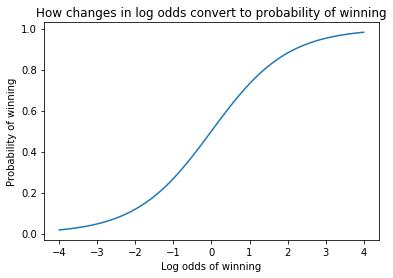

In [6]:
xs = np.linspace(-4,4,100)
pl.xlabel("Log odds of winning")
pl.ylabel("Probability of winning")
pl.title("How changes in log odds convert to probability of winning")
pl.plot(xs, 1/(1+np.exp(-xs)))
pl.show()

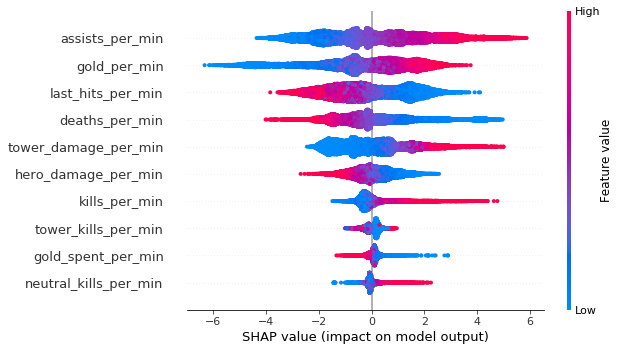

In [7]:
shap.summary_plot(shap_values, Xv)


In [8]:
shap.force_plot(explainer.expected_value, shap_values, data_df)


C:\Users\admin\Anaconda3\lib\site-packages\shap\plots\force.py:145: UserWarning: shap.force_plot is slow for many thousands of rows, try subsampling your data.
  warnings.warn("shap.force_plot is slow for many thousands of rows, try subsampling your data.")


In [9]:
shap_values_total=[]
for i in range(len(shap_values.tolist())):
    shap_values_total.append(sum(shap_values[i,:]))
#print(shap_values_total)

#both_test = pandas.concat([shap_values_total, yv], axis=1)

In [10]:
c={'predict_value':shap_values_total,
  'true_value':yv}
both_test=pd.DataFrame(c)

In [11]:
print(both_test)

        predict_value  true_value
89199        2.998642           1
85118        7.596735           1
64498       -5.642368           0
99501        4.732436           1
62497        5.348936           1
...               ...         ...
30799       -1.217290           0
109683      -7.019168           0
55725        5.061581           1
93001        3.276527           1
107773       5.501839           1

[25270 rows x 2 columns]


In [12]:
from sklearn.metrics import accuracy_score
both_test["y_pred"] = 0
both_test.loc[both_test["predict_value"] > 0, 'y_pred'] = 1
print ("\nTrain Confusion Matrix\n\n",
       pd.crosstab(both_test['true_value'], both_test['y_pred'], rownames=["Actuall"], colnames=["Predicted"]))
print ("\nTrain Accuracy:", round(accuracy_score(both_test['true_value'], both_test['y_pred']), 4))


Train Confusion Matrix

 Predicted      0      1
Actuall                
0          11360   1270
1           1157  11483

Train Accuracy: 0.904
